# Image Conversion

In [1]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from matplotlib import pyplot as plt
import datetime
import numpy as np

In [2]:
from pyts.datasets import load_gunpoint
from pyts.image import GramianAngularField

In [3]:
from multiprocessing import Pool, cpu_count
import os

In [4]:
import torch
from fastai.vision import *
from fastai.metrics import error_rate
from fastai.tabular import *
import pandas as pd

In [5]:
pd.set_option('display.max_rows', 10000)

### 1. Load data

In [6]:
data = pd.read_csv('../data/first_combined.csv')
#data = data.drop('time',axis=1)
data.head()

,close,date,minute
0,8391.10,2017-01-02,09:15:00
1,8391.15,2017-01-02,09:16:00
2,8373.60,2017-01-02,09:17:00
3,8376.75,2017-01-02,09:18:00
4,8373.70,2017-01-02,09:19:00


- Dataframe to work with for Gramian Field Algorithm

In [7]:
temp = data.groupby('date', as_index=True)['close'].apply(list).to_frame()
date_feat_df = pd.DataFrame(temp['close'].to_list(), index=temp.index)
date_feat_df.sample(10)

,0,1,2,3,4,5,6,7,8,9,...,50,51,52,53,54,55,56,57,58,59
date,,,,,,,,,,,,,,,,,,,,,
2020-01-16,12480.75,12483.65,12485.90,12491.00,12492.25,12493.15,12490.55,12493.50,12492.15,12491.45,...,12493.05,12492.65,12492.45,12492.75,12491.00,12491.05,12487.15,12488.10,12487.55,12487.35
2018-04-26,10990.85,10996.05,10992.60,10995.05,10991.10,10997.70,10999.55,10997.40,10999.65,11001.15,...,11000.85,11001.20,11003.45,11004.10,11000.70,11001.25,10999.40,10996.55,10995.55,10996.85
2017-01-13,8682.10,8677.10,8676.60,8677.60,8675.55,8669.60,8670.45,8664.80,8671.15,8673.00,...,8638.55,8639.00,8644.35,8644.30,8641.90,8636.10,8636.25,8634.35,8627.80,8624.80
2018-01-02,10953.50,10956.75,10956.90,10947.85,10939.40,10939.60,10936.50,10934.00,10928.40,10926.45,...,10865.50,10870.85,10871.90,10867.30,10859.55,10857.00,10862.40,10865.70,10871.45,10876.70
2018-01-31,11408.95,11415.15,11412.45,11401.20,11390.55,11396.30,11402.20,11407.70,11408.65,11409.20,...,11406.90,11405.70,11406.25,11405.10,11407.90,11414.15,11413.40,11411.20,11410.35,11412.70
2020-05-12,9317.95,9311.50,9317.45,9321.70,9309.85,9301.50,9307.25,9312.05,9309.75,9312.05,...,9228.00,9219.05,9234.70,9241.10,9245.45,9259.35,9256.90,9264.55,9261.90,9270.50
2017-05-08,9655.25,9655.10,9647.20,9647.25,9654.85,9646.60,9648.75,9646.45,9649.10,9648.60,...,9654.40,9653.55,9653.85,9656.65,9658.70,9660.45,9660.15,9658.50,9658.25,9657.90
2018-02-09,10784.25,10790.30,10782.05,10794.05,10800.05,10788.25,10800.75,10812.85,10808.60,10794.90,...,10813.40,10817.05,10817.65,10822.40,10826.10,10829.40,10826.15,10826.45,10826.70,10829.20
2019-11-06,12033.65,12035.85,12027.50,12024.45,12023.70,12035.10,12034.80,12038.25,12033.40,12033.90,...,12011.20,12006.05,12007.30,12005.45,12000.55,11996.65,11995.30,11997.80,11996.95,12001.10


In [14]:
gramian_df = date_feat_df.copy()
gramian_df.to_csv('gramian_df.csv', index=True)
gramian_df.head()

,0,1,2,3,4,5,6,7,8,9,...,50,51,52,53,54,55,56,57,58,59
date,,,,,,,,,,,,,,,,,,,,,
2017-01-02,8391.10,8391.15,8373.60,8376.75,8373.70,8365.60,8371.20,8368.10,8368.85,8369.85,...,8363.85,8361.05,8361.25,8361.75,8360.65,8358.25,8357.20,8357.05,8358.05,8358.15
2017-01-03,8385.10,8382.75,8380.30,8380.65,8377.20,8371.30,8377.50,8379.45,8379.95,8372.95,...,8389.05,8389.90,8389.45,8393.35,8394.15,8395.30,8391.55,8393.45,8396.20,8403.10
2017-01-04,8423.35,8430.15,8429.45,8425.35,8429.10,8431.70,8434.05,8424.95,8425.95,8422.35,...,8437.25,8435.65,8432.40,8429.95,8428.55,8433.95,8435.35,8434.85,8437.75,8438.85
2017-01-05,8450.80,8452.90,8445.95,8451.20,8451.95,8459.20,8461.30,8460.75,8459.85,8460.00,...,8464.90,8462.50,8460.65,8461.50,8462.70,8462.40,8461.25,8460.15,8458.25,8462.55
2017-01-06,8522.20,8525.25,8519.60,8521.60,8520.40,8522.05,8521.20,8532.65,8531.20,8531.35,...,8535.35,8535.60,8536.55,8536.80,8534.65,8532.35,8529.35,8525.90,8527.80,8525.90


In [15]:
def convert_img(img_path, idx, curr_X_gadf, gramian_df):
    
    fig = plt.figure()
    ax = plt.subplot(111)

    date_str = str(gramian_df.index[idx])
    fname = f'{img_path}/{date_str}.png'

    ax.imshow(curr_X_gadf, cmap='rainbow', origin='lower')
    ax.set_title('')
    ax.set_xticks([])
    ax.set_yticks([])

    fig.savefig(fname, bbox_inches='tight')

In [16]:
def gramian_img(img_path, gramian_df):
    
    # scale inputs to [-1,1]
    scaler = MinMaxScaler(feature_range=(-1,1))
    # did not flatten the images
    gadf = GramianAngularField(sample_range=(-1,1), method='difference') #
    
    for idx in range(gramian_df.shape[0]):
        curr_row = np.array(gramian_df.iloc[idx].dropna()).reshape(-1, 1)
        model = scaler.fit(curr_row)
        curr_feat = model.transform(curr_row).T

        # gramian
        curr_X_gadf = gadf.fit_transform(curr_feat)
        # convert image
        convert_img(img_path, idx, curr_X_gadf[0], gramian_df)

C:\Users\sohyun\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


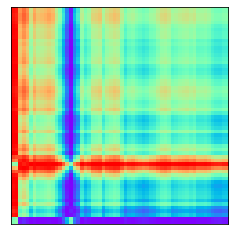

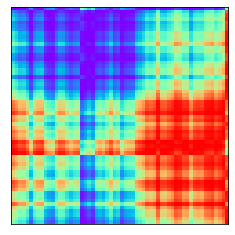

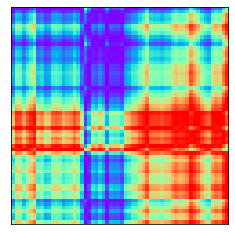

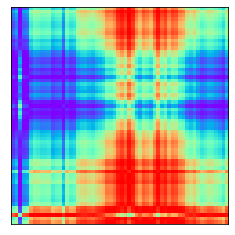

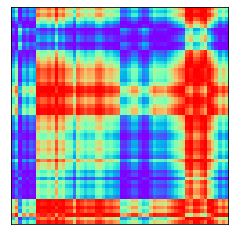

...

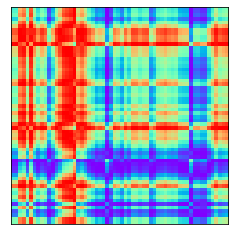

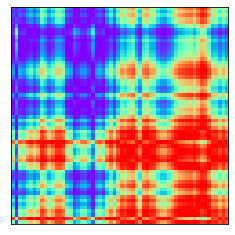

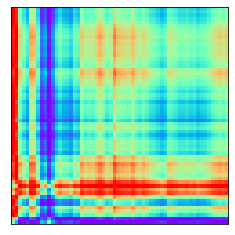

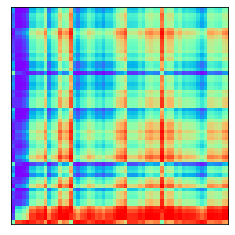

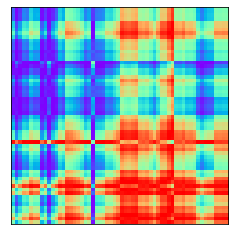

In [17]:
img_path = '../data/imgs'
gramian_img(img_path,gramian_df)

In [18]:
gramian_df.shape

(988, 60)